In [1]:
import numpy as np
import pandas as pd

In [2]:
movies=pd.read_csv(r"C:\Users\johnf\forks\Netflix\Data\netflix_movies_detailed_up_to_2025.csv")
shows=pd.read_csv(r"C:\Users\johnf\forks\Netflix\Data\netflix_tv_shows_detailed_up_to_2025.csv")

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [5]:
import importlib
import visualization_functions

importlib.reload(visualization_functions)

<module 'visualization_functions' from 'C:\\Users\\johnf\\forks\\Netflix\\visualization_functions.py'>

In [6]:
from visualization_functions import *

# Analysis Related to Genres On Movies

## Data Cleaning

In [7]:
missing_percentage = movies.isnull().mean() * 100
print(missing_percentage)

show_id           0.00000
type              0.00000
title             0.00000
director          0.82500
cast              1.27500
country           2.91250
date_added        0.00000
release_year      0.00000
rating            0.00000
duration        100.00000
genres            0.66875
language          0.00000
description       0.82500
popularity        0.00000
vote_count        0.00000
vote_average      0.00000
budget            0.00000
revenue           0.00000
dtype: float64


In [8]:
movies.drop(columns=['duration'],inplace=True)
movies=movies.fillna('missing')

In [9]:
movies_exp=movies.copy()
movies_exp['genres']=movies_exp['genres'].apply(lambda x: [genre.strip() for genre in x.split(',')])

In [10]:
df=movies.copy()
df['genres'] = df['genres'].str.split(', ')
movies_exploded = df.explode('genres', ignore_index=True)
movies_exploded=movies_exploded[movies_exploded['genres']!='missing']

## Checking if box office profit making ability of movies affect its popularity scores

In [18]:
import pandas as pd
df=movies_exploded.copy()
# Assuming your DataFrame is named df
df['profit'] = df['revenue'] - df['budget']
df['profit_ratio'] = df['profit'] / df['budget']
df['profitable'] = (df['revenue'] > df['budget']).astype(int)


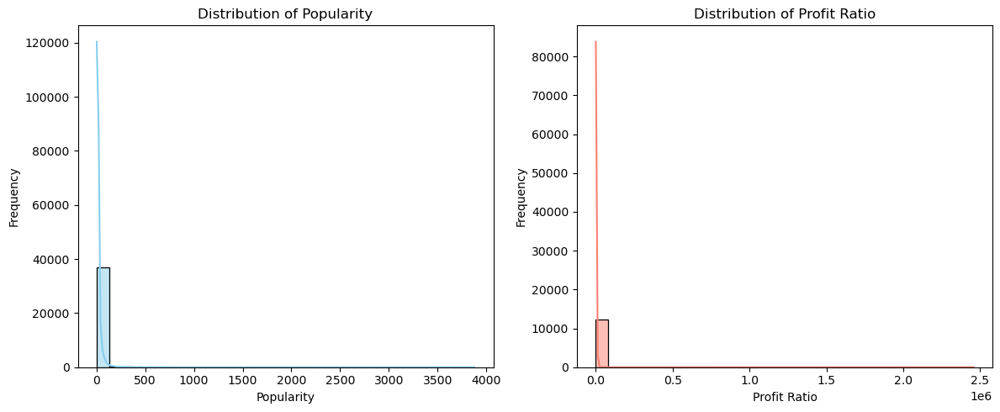

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set up figure
plt.figure(figsize=(12, 5))

# Popularity histogram
plt.subplot(1, 2, 1)
sns.histplot(df['popularity'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Popularity')
plt.xlabel('Popularity')
plt.ylabel('Frequency')

# Profit ratio histogram
plt.subplot(1, 2, 2)
sns.histplot(df['profit_ratio'], bins=30, kde=True, color='salmon')
plt.title('Distribution of Profit Ratio')
plt.xlabel('Profit Ratio')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


## Since popularity scores and profit_ratio does not follow normal distribution we use the spearman coeff

In [20]:
spearman_corr = df[['profit_ratio', 'popularity']].corr(method='spearman')
print(spearman_corr) 


              profit_ratio  popularity
profit_ratio       1.00000     0.47555
popularity         0.47555     1.00000


In [21]:
from scipy.stats import ttest_ind

profitable_popularity = df[df['profitable'] == 1]['popularity']
non_profitable_popularity = df[df['profitable'] == 0]['popularity']

t_stat, p_value = ttest_ind(profitable_popularity, non_profitable_popularity, equal_var=False)
print(f"T-statistic: {t_stat:.3f}, p-value: {p_value:.3e}")


T-statistic: 15.978, p-value: 6.133e-57


In [22]:
print("Mean popularity (profitable):", profitable_popularity.mean())
print("Mean popularity (not profitable):", non_profitable_popularity.mean())


Mean popularity (profitable): 35.438606774135124
Mean popularity (not profitable): 17.13872666363843


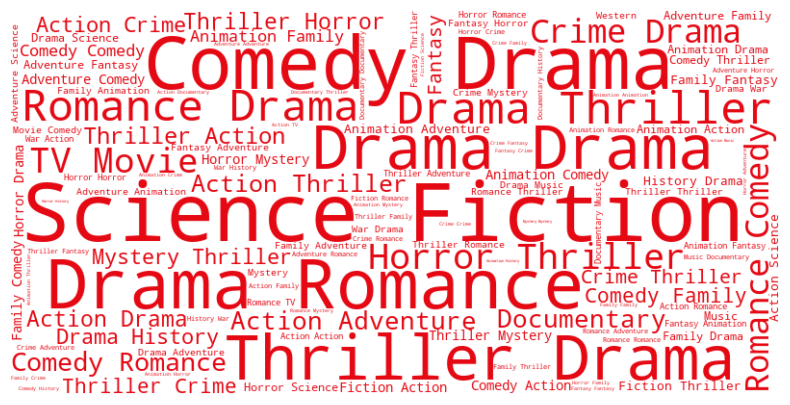

In [10]:
plot_wordcloud(movies_exploded,'genres')

## Rating Analysis for each genre

In [11]:
generate_boxplot_interactive(movies_exploded,'genres','rating',True)

### F-test to check the statistical significance of differences between mean values of ratings of genres

In [12]:
f_stat,f_crit,sse_rating=Ftest(movies_exploded,'genres','rating',0.05)
print(f_stat," ",f_crit)

67.79061804407596   1.6041256128850678


### LSD test to find the significant differences

In [13]:
dic=LSD_test(movies_exploded,'genres','rating',sse_rating,0.05)

### Results from F-test and LSD tests

In [14]:
for key,val in dic.items():
    if len(val)==0:
        print(key,"is not significantly higher rated than any genre")
        print()
    else:
        print(key,"is significantly higher rated than the following genres:")
        for g in val:
            print(g)
        print()

Western is significantly higher rated than the following genres:
Horror

Drama is significantly higher rated than the following genres:
Comedy
Horror
Science Fiction
Romance
Action
Thriller
Mystery

History is significantly higher rated than the following genres:
Western
Drama
Documentary
Comedy
Crime
Horror
Family
Fantasy
Science Fiction
Romance
Adventure
Action
Thriller
Mystery
TV Movie

Documentary is significantly higher rated than the following genres:
Horror
Science Fiction
Romance
Thriller

Comedy is significantly higher rated than the following genres:
Horror
Science Fiction
Romance
Thriller

Crime is significantly higher rated than the following genres:
Comedy
Horror
Science Fiction
Romance
Action
Thriller
Mystery

War is significantly higher rated than the following genres:
Western
Drama
Documentary
Comedy
Crime
Horror
Fantasy
Science Fiction
Romance
Adventure
Action
Thriller
Mystery
TV Movie

Horror is not significantly higher rated than any genre

Family is significantly hi

## Popularity Analysis for each Genre

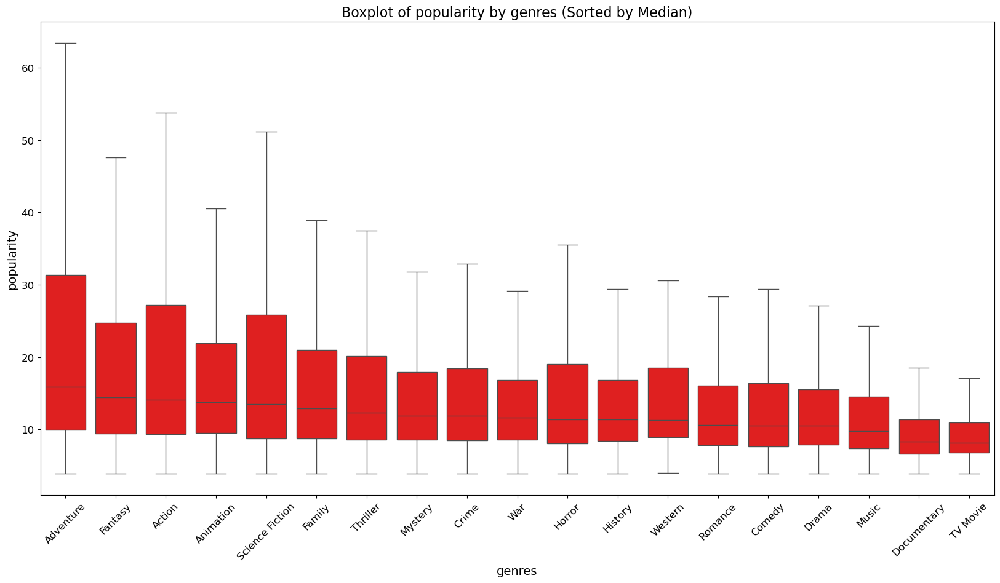

In [15]:
generate_boxplot(movies_exploded,'genres','popularity',False)

### F-test to check the statistical significance of differences between mean values of popularity scores of genres

In [16]:
f_stat,f_crit,sse_pop=Ftest(movies_exploded,'genres','popularity',0.05)
print(f_stat," ",f_crit)

13.963610679717286   1.6041256128850678


### LSD test to find the significant differences

In [17]:
dic=LSD_test(movies_exploded,'genres','popularity',sse_pop,0.05)

### Results from F-test and LSD tests

In [18]:
for key,val in dic.items():
    if len(val)==0:
        print(key,"is not significantly higher popularity rated than any genre")
        print()
    else:
        print(key,"is significantly higher popularity rated than the following genres:")
        for g in val:
            print(g)
        print()

Western is not significantly higher popularity rated than any genre

Drama is significantly higher popularity rated than the following genres:
Documentary

History is not significantly higher popularity rated than any genre

Documentary is not significantly higher popularity rated than any genre

Comedy is significantly higher popularity rated than the following genres:
Documentary
TV Movie

Crime is significantly higher popularity rated than the following genres:
Drama
Documentary
TV Movie

War is significantly higher popularity rated than the following genres:
Documentary
TV Movie

Horror is significantly higher popularity rated than the following genres:
Drama
Documentary
TV Movie

Family is significantly higher popularity rated than the following genres:
Drama
History
Documentary
Comedy
Crime
Horror
Romance
Mystery
TV Movie
Music

Fantasy is significantly higher popularity rated than the following genres:
Drama
History
Documentary
Comedy
Romance
Mystery
TV Movie
Music

Science Fict

## Revenue vs Genre Analysis

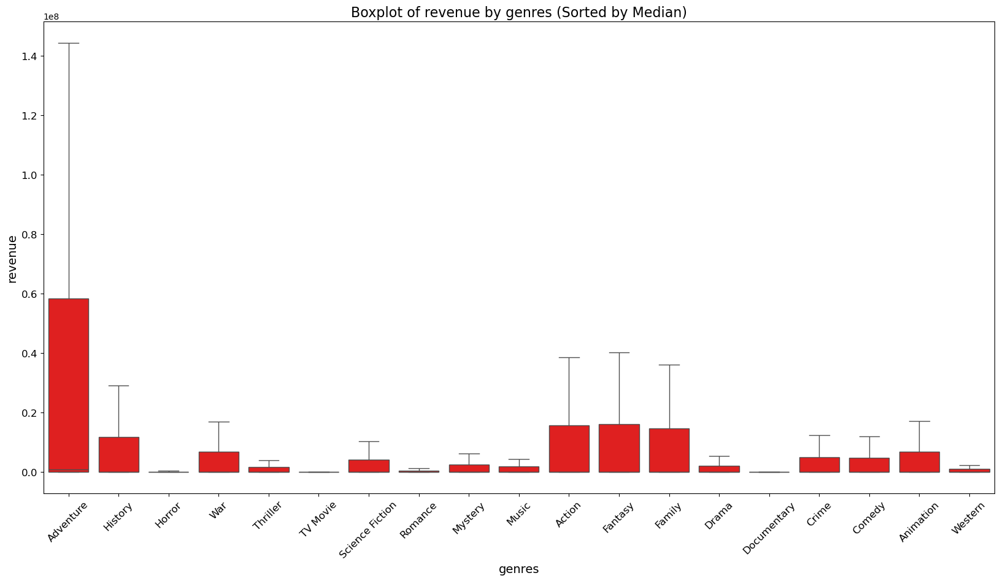

In [19]:
generate_boxplot(movies_exploded,'genres','revenue',False)

### F-test to check the statistical significance of differences between mean values of revenues of genres

In [20]:
f_stat,f_crit,sse_rev=Ftest(movies_exploded,'genres','revenue',0.05)
print(f_stat," ",f_crit)

80.84625176052513   1.6041256128850678


### LSD test to find the significant differences

In [21]:
dic=LSD_test(movies_exploded,'genres','revenue',sse_rev,0.05)

### Results from F-test and LSD tests

In [22]:
for key,val in dic.items():
    if len(val)==0:
        print(key,"does not generate higher revenue than any genre")
        print()
    else:
        print(key,"generates more revenue than the following genres:")
        for g in val:
            print(g)
        print()

Western does not generate higher revenue than any genre

Drama generates more revenue than the following genres:
Documentary
TV Movie

History generates more revenue than the following genres:
Documentary
Horror
TV Movie

Documentary does not generate higher revenue than any genre

Comedy generates more revenue than the following genres:
Drama
Documentary
Horror
Romance
Thriller
Mystery
TV Movie

Crime generates more revenue than the following genres:
Drama
Documentary
Horror
Romance
TV Movie

War generates more revenue than the following genres:
Drama
Documentary
Horror
Romance
TV Movie

Horror generates more revenue than the following genres:
Documentary

Family generates more revenue than the following genres:
Western
Drama
History
Documentary
Comedy
Crime
War
Horror
Romance
Thriller
Mystery
TV Movie
Animation
Music

Fantasy generates more revenue than the following genres:
Western
Drama
History
Documentary
Comedy
Crime
War
Horror
Romance
Thriller
Mystery
TV Movie
Animation
Music

S

## Budget vs Revenue Analysis

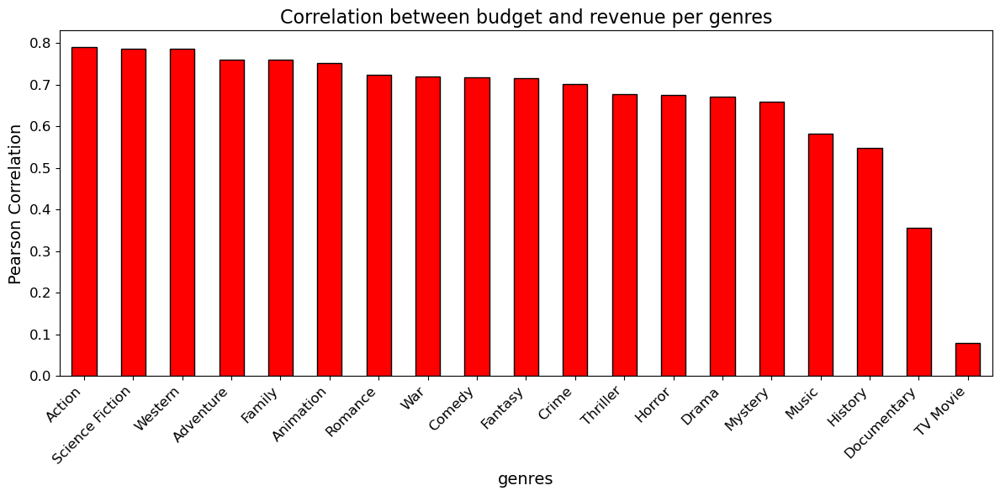

In [23]:
plot_categorywise_corr(movies_exploded,'budget','revenue','genres')

## Budget vs Popularity Analysis

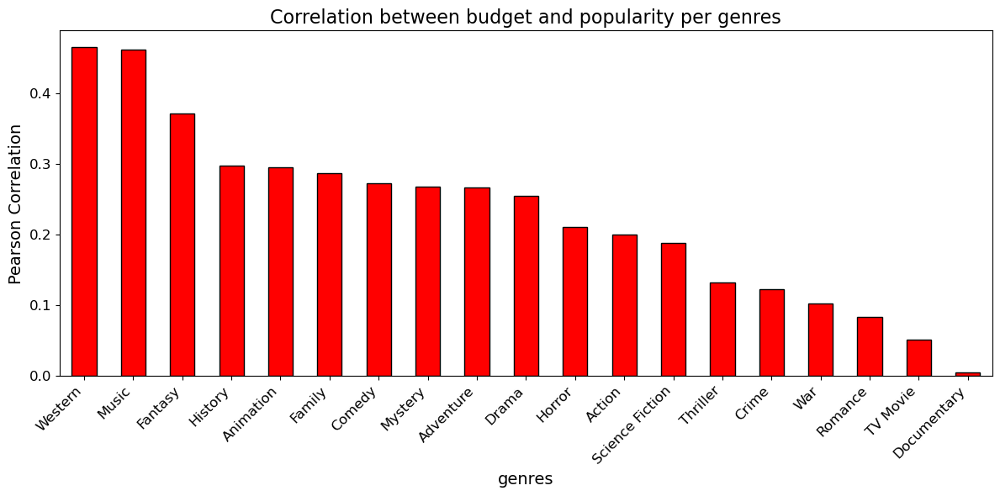

In [24]:
plot_categorywise_corr(movies_exploded,'budget','popularity','genres')

## Popularity of every genre with time

In [25]:
plot_change_over_time(movies_exploded,'popularity','release_year','genres')

## Change in number of movies of a particular genre produced per year across time

In [26]:
plot_number_across_time(movies_exploded,'genres','release_year')

In [27]:
cumulative_number_plot(movies_exploded,'release_year','genres')

In [28]:
sunburst_plot(movies_exploded,'genres','language')

In [29]:
dic={'Animation ,Family': 6.703772167487692,
 'Animation ,Romance': 7.010959183673473,
 'Animation ,Thriller': 6.537142857142857,
 'Animation ,Science Fiction': 6.796076666666667,
 'Animation ,Western': 7.013400000000002,
 'Animation ,Horror': 6.51493220338983,
 'Animation ,History': 6.69362962962963,
 'Animation ,Comedy': 6.728316568047331,
 'Animation ,Fantasy': 6.944435272045022,
 'Animation ,Documentary': 7.3961250000000005,
 'Animation ,Action': 6.802515418502201,
 'Animation ,Drama': 7.033176923076923,
 'Animation ,TV Movie': 7.055278688524591,
 'Animation ,War': 6.774380952380951,
 'Animation ,Music': 6.862806451612902,
 'Animation ,Adventure': 6.779389999999994,
 'Animation ,Mystery': 7.067451923076923,
 'Animation ,Crime': 6.874444444444445,
 'Family ,Romance': 6.423662921348316,
 'Family ,Thriller': 6.3635,
 'Family ,Science Fiction': 6.551341269841269,
 'Family ,Western': 7.222333333333334,
 'Family ,Horror': 6.787285714285714,
 'Family ,History': 6.9904375000000005,
 'Family ,Comedy': 6.472672172808132,
 'Family ,Fantasy': 6.564265350877192,
 'Family ,Documentary': 7.054866666666668,
 'Family ,Action': 6.547907407407409,
 'Family ,Drama': 6.6194028776978415,
 'Family ,TV Movie': 6.4601567164179095,
 'Family ,War': 6.3342857142857145,
 'Family ,Music': 6.652397058823531,
 'Family ,Adventure': 6.575573268921088,
 'Family ,Mystery': 7.033571428571434,
 'Family ,Crime': 6.281391304347826,
 'Romance ,Thriller': 5.95856,
 'Romance ,Science Fiction': 6.099848101265822,
 'Romance ,Western': 6.585714285714286,
 'Romance ,Horror': 5.279918032786884,
 'Romance ,History': 6.623303571428572,
 'Romance ,Comedy': 6.128391588785054,
 'Romance ,Fantasy': 6.580858108108108,
 'Romance ,Documentary': 5.012499999999999,
 'Romance ,Action': 5.927465517241378,
 'Romance ,Drama': 6.150581213307238,
 'Romance ,TV Movie': 6.174547872340423,
 'Romance ,War': 6.751310344827586,
 'Romance ,Music': 6.585409638554216,
 'Romance ,Adventure': 6.432603174603173,
 'Romance ,Mystery': 5.868558139534883,
 'Romance ,Crime': 6.127797101449276,
 'Thriller ,Science Fiction': 5.672908212560393,
 'Thriller ,Western': 6.17771875,
 'Thriller ,Horror': 5.578617058311571,
 'Thriller ,History': 6.590990099009901,
 'Thriller ,Comedy': 5.906476190476189,
 'Thriller ,Fantasy': 5.849629921259841,
 'Thriller ,Documentary': 6.626124999999999,
 'Thriller ,Action': 5.93834372367312,
 'Thriller ,Drama': 6.05841648898366,
 'Thriller ,TV Movie': 5.959585365853656,
 'Thriller ,War': 6.505560000000001,
 'Thriller ,Music': 5.9985333333333335,
 'Thriller ,Adventure': 5.8284851063829795,
 'Thriller ,Mystery': 5.883181451612907,
 'Thriller ,Crime': 6.1233979166666614,
 'Science Fiction ,Western': 5.8069999999999995,
 'Science Fiction ,Horror': 5.397810198300279,
 'Science Fiction ,History': 6.333333333333333,
 'Science Fiction ,Comedy': 6.042070312499996,
 'Science Fiction ,Fantasy': 6.142125714285715,
 'Science Fiction ,Documentary': 6.608,
 'Science Fiction ,Action': 6.0924635193132985,
 'Science Fiction ,Drama': 6.1495272727272745,
 'Science Fiction ,TV Movie': 5.535052631578949,
 'Science Fiction ,War': 6.09044,
 'Science Fiction ,Music': 5.185307692307693,
 'Science Fiction ,Adventure': 6.188800518134717,
 'Science Fiction ,Mystery': 5.9826402877697875,
 'Science Fiction ,Crime': 6.200464285714287,
 'Western ,Horror': 5.2896,
 'Western ,History': 6.900000000000001,
 'Western ,Comedy': 6.244733333333333,
 'Western ,Fantasy': 5.448142857142857,
 'Western ,Action': 5.87448888888889,
 'Western ,Drama': 6.3417246376811605,
 'Western ,Adventure': 6.194533333333333,
 'Western ,Mystery': 6.609624999999999,
 'Western ,Crime': 6.479499999999999,
 'Horror ,History': 6.016388888888888,
 'Horror ,Comedy': 5.472899713467047,
 'Horror ,Fantasy': 5.621473451327433,
 'Horror ,Documentary': 5.7299,
 'Horror ,Action': 5.471048192771086,
 'Horror ,Drama': 5.755779097387168,
 'Horror ,TV Movie': 5.123553571428571,
 'Horror ,War': 5.841105263157894,
 'Horror ,Music': 5.820230769230769,
 'Horror ,Adventure': 5.355139784946236,
 'Horror ,Mystery': 5.67314902807776,
 'Horror ,Crime': 5.835108108108109,
 'History ,Comedy': 6.802937499999999,
 'History ,Fantasy': 5.580157894736842,
 'History ,Documentary': 7.077058823529412,
 'History ,Action': 6.512993243243243,
 'History ,Drama': 6.6900779220779265,
 'History ,TV Movie': 6.512466666666667,
 'History ,War': 6.769941558441556,
 'History ,Music': 6.843285714285716,
 'History ,Adventure': 6.230181818181821,
 'History ,Mystery': 6.404937499999998,
 'History ,Crime': 6.8552173913043495,
 'Comedy ,Fantasy': 6.474484913793107,
 'Comedy ,Documentary': 6.24227027027027,
 'Comedy ,Action': 6.083804999999999,
 'Comedy ,Drama': 6.255237693389604,
 'Comedy ,TV Movie': 6.324078947368418,
 'Comedy ,War': 6.335099999999999,
 'Comedy ,Music': 6.717794520547943,
 'Comedy ,Adventure': 6.426360507246375,
 'Comedy ,Mystery': 6.45362658227848,
 'Comedy ,Crime': 6.1060393442622924,
 'Fantasy ,Documentary': 6.2,
 'Fantasy ,Action': 6.305766375545847,
 'Fantasy ,Drama': 6.334671270718234,
 'Fantasy ,TV Movie': 6.3172435897435895,
 'Fantasy ,War': 6.397692307692308,
 'Fantasy ,Music': 6.522274999999999,
 'Fantasy ,Adventure': 6.410884745762711,
 'Fantasy ,Mystery': 6.32623711340206,
 'Fantasy ,Crime': 6.042708333333334,
 'Documentary ,Action': 5.941416666666668,
 'Documentary ,Drama': 6.488163934426229,
 'Documentary ,TV Movie': 7.162520000000001,
 'Documentary ,War': 6.773999999999999,
 'Documentary ,Music': 7.054520325203252,
 'Documentary ,Adventure': 7.3554,
 'Documentary ,Mystery': 6.725,
 'Documentary ,Crime': 6.724918367346939,
 'Action ,Drama': 6.245582758620694,
 'Action ,TV Movie': 5.876624999999999,
 'Action ,War': 6.466456647398843,
 'Action ,Music': 5.23942857142857,
 'Action ,Adventure': 6.224772941176472,
 'Action ,Mystery': 6.085233830845772,
 'Action ,Crime': 6.135787318361951,
 'Drama ,TV Movie': 6.355903669724774,
 'Drama ,War': 6.683484745762705,
 'Drama ,Music': 6.495752380952378,
 'Drama ,Adventure': 6.485839650145774,
 'Drama ,Mystery': 6.044304545454548,
 'Drama ,Crime': 6.276533898305085,
 'TV Movie ,War': 6.16575,
 'TV Movie ,Music': 6.9369375,
 'TV Movie ,Adventure': 6.261852459016395,
 'TV Movie ,Mystery': 6.486189655172413,
 'TV Movie ,Crime': 6.5253265306122445,
 'War ,Music': 6.517333333333333,
 'War ,Adventure': 6.486,
 'War ,Mystery': 7.26,
 'War ,Crime': 6.930999999999999,
 'Music ,Adventure': 6.355846153846152,
 'Music ,Mystery': 6.7,
 'Music ,Crime': 6.6754999999999995,
 'Adventure ,Mystery': 6.3748068181818205,
 'Adventure ,Crime': 6.317634408602151,
 'Mystery ,Crime': 6.267904436860068}

In [30]:
plot_top20(dic,'genres','rating')

In [109]:
dic={'Science Fiction ,Comedy': 34.49083593750001,
 'Science Fiction ,Thriller': 41.1862729468599,
 'Science Fiction ,Mystery': 20.39635251798562,
 'Science Fiction ,Drama': 21.024993939393937,
 'Science Fiction ,Documentary': 28.587249999999997,
 'Science Fiction ,History': 22.716499999999996,
 'Science Fiction ,Family': 50.22513492063491,
 'Science Fiction ,TV Movie': 10.561907894736839,
 'Science Fiction ,Crime': 15.865625000000003,
 'Science Fiction ,Horror': 25.98630028328613,
 'Science Fiction ,Animation': 23.078756666666663,
 'Science Fiction ,Adventure': 40.981251295336826,
 'Science Fiction ,Fantasy': 16.613125714285715,
 'Science Fiction ,Romance': 63.94781012658228,
 'Science Fiction ,War': 18.61508,
 'Science Fiction ,Action': 39.94727038626611,
 'Science Fiction ,Music': 12.100076923076923,
 'Science Fiction ,Western': 17.914666666666665,
 'Comedy ,Thriller': 20.84009956709957,
 'Comedy ,Mystery': 15.500392405063288,
 'Comedy ,Drama': 14.834845288326305,
 'Comedy ,Documentary': 11.428189189189188,
 'Comedy ,History': 12.82591666666667,
 'Comedy ,Family': 32.74745616264298,
 'Comedy ,TV Movie': 11.077578947368417,
 'Comedy ,Crime': 18.940865573770488,
 'Comedy ,Horror': 16.08812893982808,
 'Comedy ,Animation': 31.634050295858003,
 'Comedy ,Adventure': 31.999994565217385,
 'Comedy ,Fantasy': 23.870314655172386,
 'Comedy ,Romance': 16.54371121495326,
 'Comedy ,War': 17.638749999999998,
 'Comedy ,Action': 34.222188333333335,
 'Comedy ,Music': 17.381308219178084,
 'Comedy ,Western': 21.779066666666665,
 'Thriller ,Mystery': 16.29242607526884,
 'Thriller ,Drama': 17.055789623311984,
 'Thriller ,Documentary': 21.867875,
 'Thriller ,History': 16.80341584158416,
 'Thriller ,Family': 15.92495,
 'Thriller ,TV Movie': 11.671658536585369,
 'Thriller ,Crime': 25.391923958333305,
 'Thriller ,Horror': 22.98403394255873,
 'Thriller ,Animation': 18.968190476190482,
 'Thriller ,Adventure': 31.462838297872334,
 'Thriller ,Fantasy': 17.74092125984252,
 'Thriller ,Romance': 42.807500000000005,
 'Thriller ,War': 22.51638666666666,
 'Thriller ,Action': 33.48357792754835,
 'Thriller ,Music': 10.064333333333332,
 'Thriller ,Western': 16.676375,
 'Mystery ,Drama': 14.443822727272734,
 'Mystery ,Documentary': 8.583875,
 'Mystery ,History': 15.412812500000001,
 'Mystery ,Family': 14.386303571428574,
 'Mystery ,TV Movie': 9.224568965517243,
 'Mystery ,Crime': 15.603088737201364,
 'Mystery ,Horror': 19.10022030237582,
 'Mystery ,Animation': 17.132461538461545,
 'Mystery ,Adventure': 17.479590909090913,
 'Mystery ,Fantasy': 16.188020618556695,
 'Mystery ,Romance': 17.601232558139532,
 'Mystery ,War': 17.206,
 'Mystery ,Action': 18.718079601990045,
 'Mystery ,Music': 9.055,
 'Mystery ,Western': 17.63075,
 'Drama ,Documentary': 10.719475409836067,
 'Drama ,History': 16.35205844155845,
 'Drama ,Family': 15.4548273381295,
 'Drama ,TV Movie': 9.135206422018351,
 'Drama ,Crime': 16.251604116222765,
 'Drama ,Horror': 16.22246793349169,
 'Drama ,Animation': 20.86979230769231,
 'Drama ,Adventure': 28.694513119533525,
 'Drama ,Fantasy': 17.104558011049726,
 'Drama ,Romance': 17.743876060013044,
 'Drama ,War': 23.8165966101695,
 'Drama ,Action': 23.977942528735625,
 'Drama ,Music': 14.669152380952374,
 'Drama ,Western': 17.499275362318837,
 'Documentary ,History': 9.792882352941179,
 'Documentary ,Family': 9.216733333333334,
 'Documentary ,TV Movie': 13.283520000000001,
 'Documentary ,Crime': 10.214285714285715,
 'Documentary ,Horror': 8.7566,
 'Documentary ,Animation': 68.81625,
 'Documentary ,Adventure': 8.694933333333333,
 'Documentary ,Fantasy': 8.782,
 'Documentary ,Romance': 16.323875,
 'Documentary ,War': 10.119428571428573,
 'Documentary ,Action': 11.979333333333331,
 'Documentary ,Music': 10.625739837398376,
 'History ,Family': 11.179250000000001,
 'History ,TV Movie': 9.046066666666666,
 'History ,Crime': 15.983456521739123,
 'History ,Horror': 14.537500000000001,
 'History ,Animation': 11.506962962962962,
 'History ,Adventure': 16.457893939393944,
 'History ,Fantasy': 14.25815789473684,
 'History ,Romance': 15.555500000000004,
 'History ,War': 17.33114935064935,
 'History ,Action': 17.90164189189189,
 'History ,Music': 13.643514285714286,
 'History ,Western': 14.506333333333336,
 'Family ,TV Movie': 12.27744029850747,
 'Family ,Crime': 20.347304347826086,
 'Family ,Horror': 20.21752380952381,
 'Family ,Animation': 34.0143891625616,
 'Family ,Adventure': 35.95509178743963,
 'Family ,Fantasy': 25.661660087719273,
 'Family ,Romance': 15.193449438202245,
 'Family ,War': 10.878,
 'Family ,Action': 49.6152962962963,
 'Family ,Music': 21.493867647058813,
 'Family ,Western': 34.94833333333333,
 'TV Movie ,Crime': 11.911020408163266,
 'TV Movie ,Horror': 12.08941071428571,
 'TV Movie ,Animation': 16.771590163934427,
 'TV Movie ,Adventure': 14.250754098360654,
 'TV Movie ,Fantasy': 12.835923076923077,
 'TV Movie ,Romance': 8.784797872340427,
 'TV Movie ,War': 7.0245,
 'TV Movie ,Action': 12.807374999999999,
 'TV Movie ,Music': 14.34715625,
 'Crime ,Horror': 20.729531531531535,
 'Crime ,Animation': 16.72811111111111,
 'Crime ,Adventure': 21.12876344086022,
 'Crime ,Fantasy': 13.227208333333332,
 'Crime ,Romance': 14.617130434782611,
 'Crime ,War': 13.085230769230769,
 'Crime ,Action': 28.46584015852049,
 'Crime ,Music': 11.3085,
 'Crime ,Western': 19.739625,
 'Horror ,Animation': 18.247186440677964,
 'Horror ,Adventure': 18.386107526881716,
 'Horror ,Fantasy': 19.077039823008846,
 'Horror ,Romance': 12.71809836065574,
 'Horror ,War': 13.457157894736843,
 'Horror ,Action': 25.764954819277126,
 'Horror ,Music': 15.919999999999998,
 'Horror ,Western': 11.4528,
 'Animation ,Adventure': 39.31226333333335,
 'Animation ,Fantasy': 28.80805065666041,
 'Animation ,Romance': 19.87292857142857,
 'Animation ,War': 13.313380952380953,
 'Animation ,Action': 27.742742290748897,
 'Animation ,Music': 25.46579032258064,
 'Animation ,Western': 23.086999999999996,
 'Adventure ,Fantasy': 31.23322542372882,
 'Adventure ,Romance': 20.425380952380962,
 'Adventure ,War': 64.57351351351352,
 'Adventure ,Action': 39.37256352941174,
 'Adventure ,Music': 24.200961538461545,
 'Adventure ,Western': 23.69113333333333,
 'Fantasy ,Romance': 19.73260135135136,
 'Fantasy ,War': 22.787384615384614,
 'Fantasy ,Action': 30.193384279475982,
 'Fantasy ,Music': 19.183824999999995,
 'Fantasy ,Western': 14.043857142857144,
 'Romance ,War': 14.385206896551724,
 'Romance ,Action': 23.692508620689665,
 'Romance ,Music': 13.634481927710844,
 'Romance ,Western': 20.755857142857142,
 'War ,Action': 33.09882658959538,
 'War ,Music': 9.941666666666666,
 'Action ,Music': 15.42542857142857,
 'Action ,Western': 14.359866666666663}

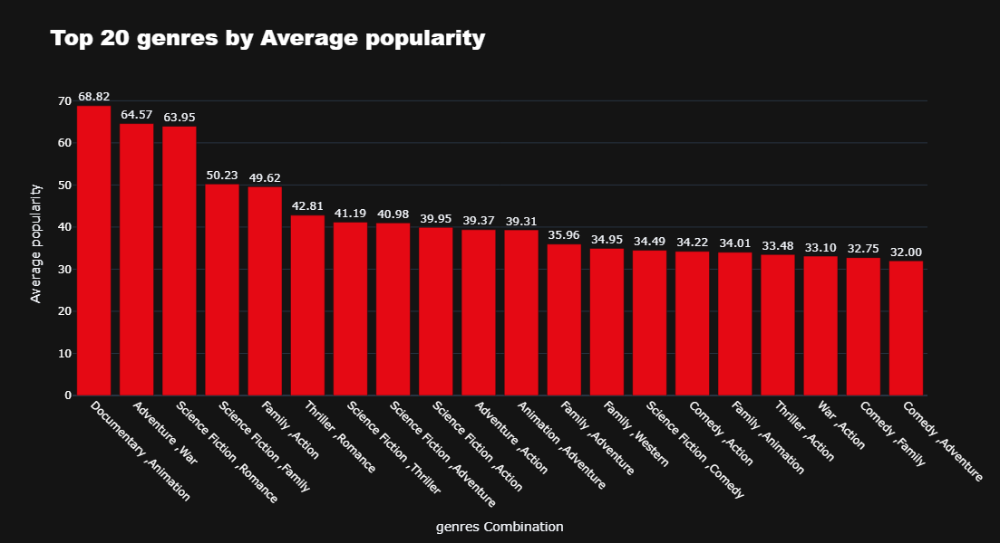

In [110]:
plot_top20(dic,'genres','popularity')

In [34]:
plot_lossmakers(movies_exploded,'revenue','budget','genres')

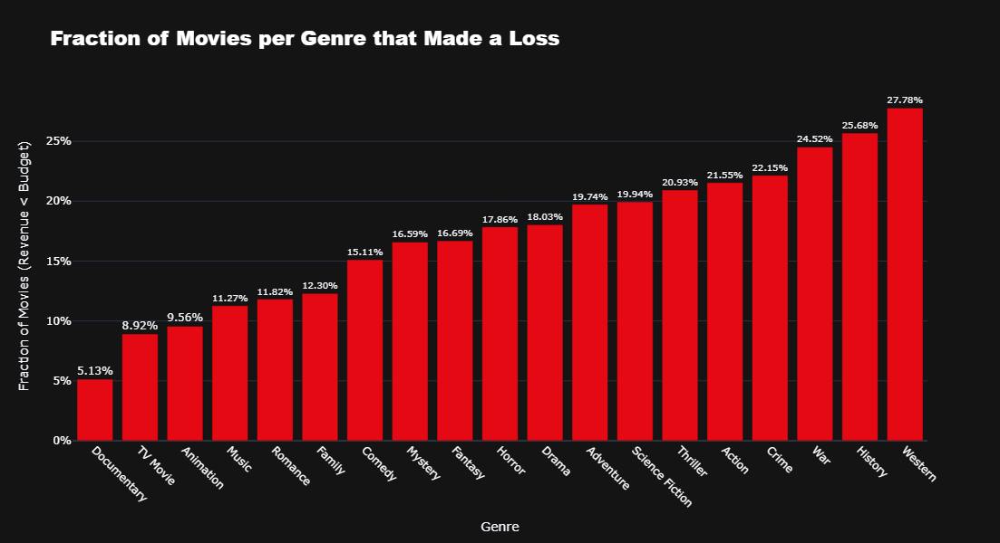

In [40]:
fraction_lossmaking(movies_exploded,'genres','revenue','budget')

In [43]:
chi2_cont_test(movies_exploded,'genres')

Chi-square Statistic: 642.0430223119432
Degrees of Freedom: 18
P-value: 1.0959895445890484e-124

Reject the null hypothesis: Profitability depends on genres


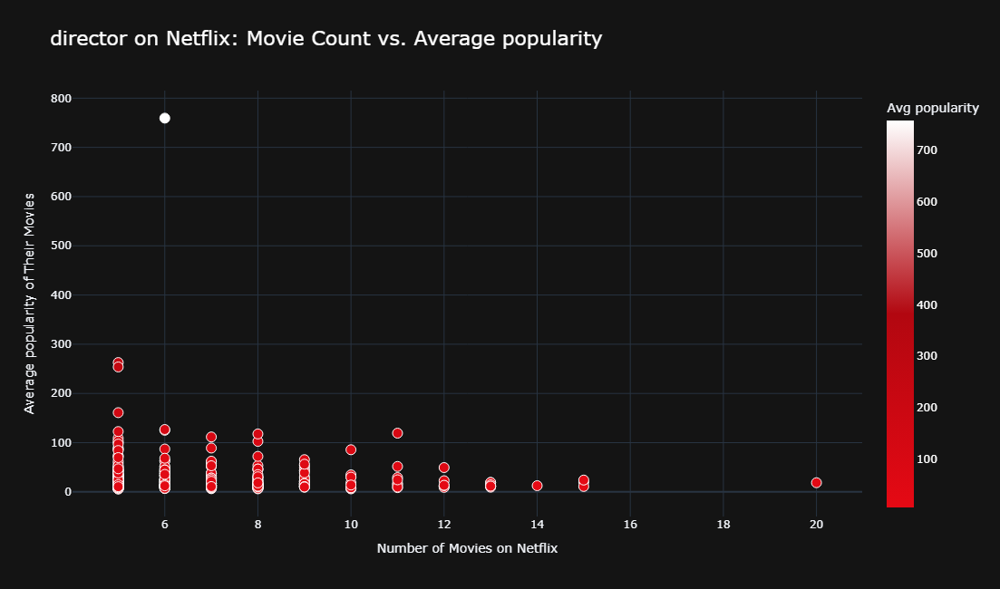

TOP 10 HIGH POTENTIAL UNDERREPRESENTED DIRECTORS
                   director     avg_var  number of movies on Netflix
3536           J.C. Chandor  262.729133                            5
7891             Sean Baker  253.831556                            5
3602            Jake Kasdan  160.987909                            5
8581          Thomas Astruc  122.553556                            5
1975     Danishka Esterhazy  109.004273                            5
4796         Kenji Kamiyama  103.115053                            5
3230     Hans Petter Moland  100.028050                            5
6266          Mike Mitchell   97.062800                            5
1661  Christopher McQuarrie   90.120077                            5
5459        Louis Leterrier   86.767417                            5


C:\Users\johnf\forks\Netflix\helper_functions.py:3506: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [105]:
gap_analysis(movies_exploded,'director','popularity')

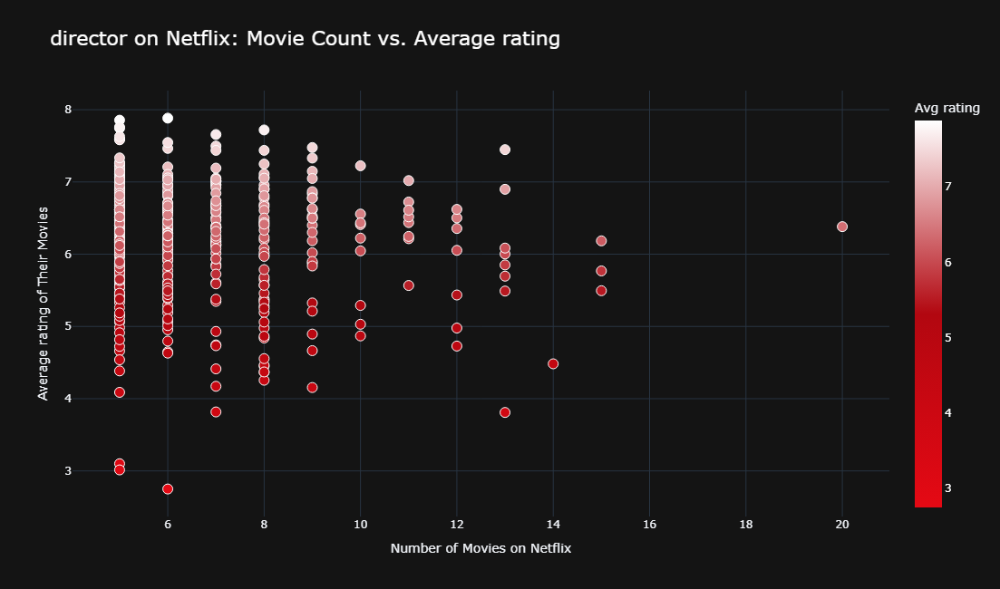

TOP 10 HIGH POTENTIAL UNDERREPRESENTED DIRECTORS
               director   avg_var  number of movies on Netflix
2606  Ernesto Contreras  7.855556                            5
8972        Victor Cook  7.759583                            5
3504        Ishi Rudell  7.744778                            5
8581      Thomas Astruc  7.628889                            5
6408       Naoko Yamada  7.594118                            5
8151       Soichi Masui  7.592308                            5
8401   Susumu Mitsunaka  7.583333                            5
9124        William Lau  7.333333                            5
8451      Takahiro Miki  7.263800                            5
1866    Damien Chazelle  7.262533                            5


C:\Users\johnf\forks\Netflix\helper_functions.py:3506: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [106]:
gap_analysis(movies_exploded,'director','rating')

# TV shows only

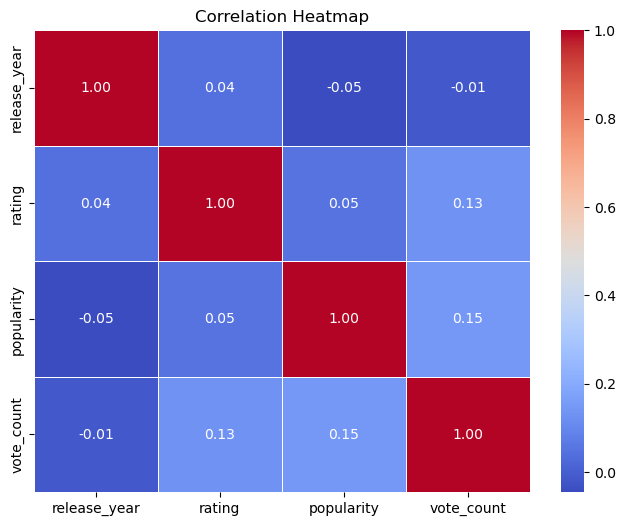

In [58]:
df=shows.select_dtypes(include=['number'])
df.drop(columns=['show_id','vote_average'],inplace=True)
corr = df.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [59]:
missing_percentage = shows.isnull().mean() * 100
print(missing_percentage)

show_id          0.00000
type             0.00000
title            0.00000
director        68.53125
cast             7.23125
country         11.23125
date_added       0.00000
release_year     0.00000
rating           0.00000
duration         0.00000
genres           6.08750
language         0.00000
description     20.03750
popularity       0.00000
vote_count       0.00000
vote_average     0.00000
dtype: float64


In [60]:
shows['duration'].unique()

array(['1 Seasons'], dtype=object)

In [61]:
shows=shows.fillna('missing')

In [62]:
shows_exp=shows.copy()
shows_exp['genres']=shows_exp['genres'].apply(lambda x: [genre.strip() for genre in x.split(',')])

In [63]:
df=shows.copy()
df['genres'] = df['genres'].str.split(', ')
shows_exploded = df.explode('genres', ignore_index=True)
shows_exploded=shows_exploded[shows_exploded['genres']!='missing']
shows_exploded=shows_exploded[shows_exploded['genres']!='Unknown']

## Rating vs Genre Anlysis

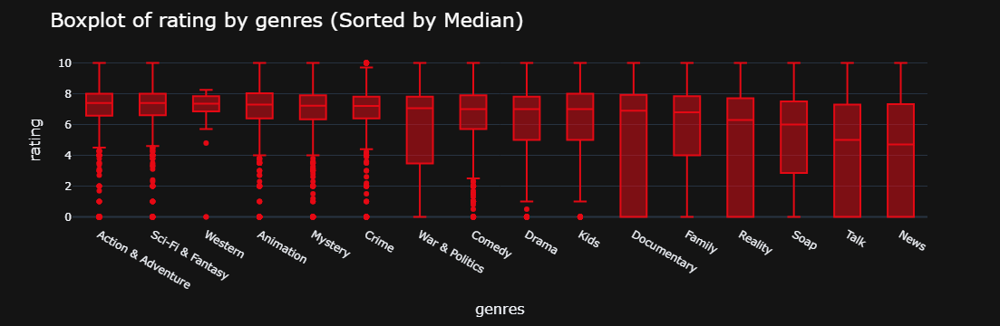

In [64]:
generate_boxplot_interactive(shows_exploded,'genres','rating',True)

In [65]:
f_stat,f_crit,sse_rating=Ftest(shows_exploded,'genres','rating',0.05)
print(f_stat," ",f_crit)

78.7800181094138   1.6667387852399038


In [66]:
dic=LSD_test(shows_exploded,'genres','rating',sse_rating,0.05)

In [67]:
for key,val in dic.items():
    if len(val)==0:
        print(key,"is not significantly higher rated than any genre")
        print()
    else:
        print(key,"is significantly higher rated than the following genres:")
        for g in val:
            print(g)
        print()

War & Politics is significantly higher rated than the following genres:
Reality
Talk
News
Documentary
Soap

Reality is significantly higher rated than the following genres:
Talk
News

Talk is not significantly higher rated than any genre

Western is significantly higher rated than the following genres:
Reality
Talk
News
Family
Documentary
Soap

Comedy is significantly higher rated than the following genres:
War & Politics
Reality
Talk
News
Drama
Family
Documentary
Soap

Crime is significantly higher rated than the following genres:
War & Politics
Reality
Talk
Comedy
News
Drama
Family
Kids
Documentary
Soap

Mystery is significantly higher rated than the following genres:
War & Politics
Reality
Talk
Comedy
News
Drama
Family
Kids
Documentary
Soap

News is not significantly higher rated than any genre

Drama is significantly higher rated than the following genres:
Reality
Talk
News
Family
Documentary
Soap

Action & Adventure is significantly higher rated than the following genres:
War & Po

## Popularity vs genre sorted by median popularity

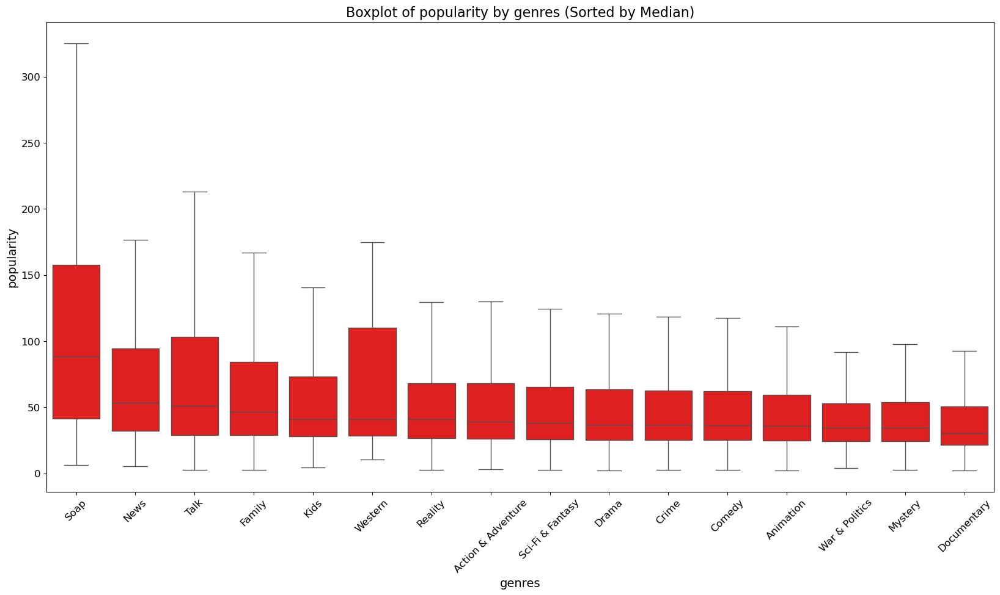

In [68]:
generate_boxplot(shows_exploded,'genres','popularity',False)

In [69]:
f_stat,f_crit,sse_pop=Ftest(shows_exploded,'genres','popularity',0.05)
print(f_stat," ",f_crit)

31.626170084289118   1.6667387852399038


In [70]:
dic=LSD_test(shows_exploded,'genres','popularity',sse_pop,0.05)

In [71]:
for key,val in dic.items():
    if len(val)==0:
        print(key,"is not significantly higher popularity rated than any genre")
        print()
    else:
        print(key,"is significantly higher popularity rated than the following genres:")
        for g in val:
            print(g)
        print()

War & Politics is not significantly higher popularity rated than any genre

Reality is significantly higher popularity rated than the following genres:
War & Politics
Comedy
Crime
Mystery
Drama
Action & Adventure
Animation
Kids
Documentary
Sci-Fi & Fantasy

Talk is significantly higher popularity rated than the following genres:
War & Politics
Reality
Comedy
Crime
Mystery
News
Drama
Action & Adventure
Family
Animation
Kids
Documentary
Sci-Fi & Fantasy

Western is not significantly higher popularity rated than any genre

Comedy is significantly higher popularity rated than the following genres:
Mystery
Animation
Documentary

Crime is significantly higher popularity rated than the following genres:
Documentary

Mystery is not significantly higher popularity rated than any genre

News is significantly higher popularity rated than the following genres:
War & Politics
Comedy
Crime
Mystery
Drama
Action & Adventure
Animation
Kids
Documentary
Sci-Fi & Fantasy

Drama is significantly higher pop

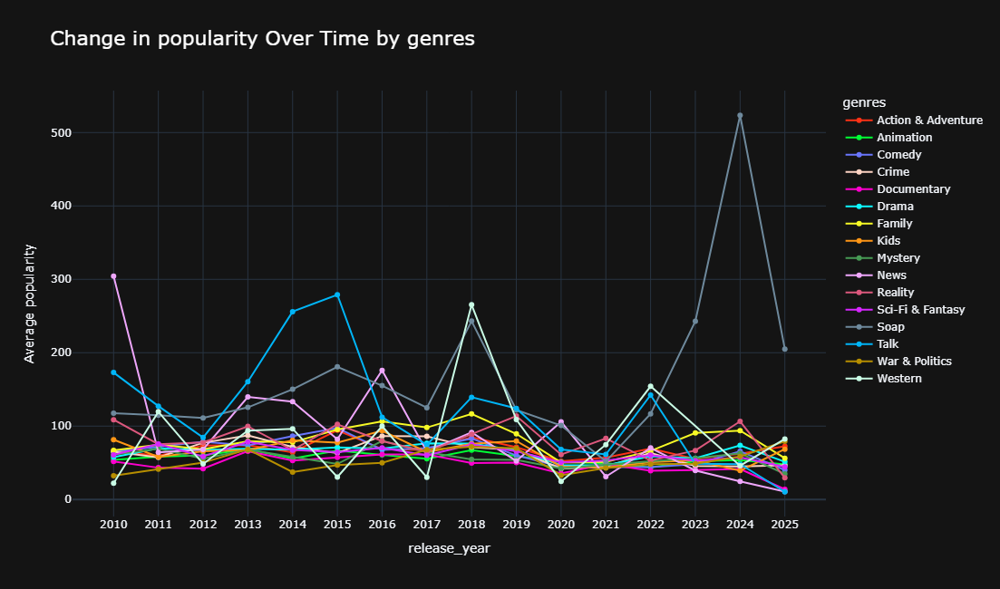

In [72]:
plot_change_over_time(shows_exploded,'popularity','release_year','genres')

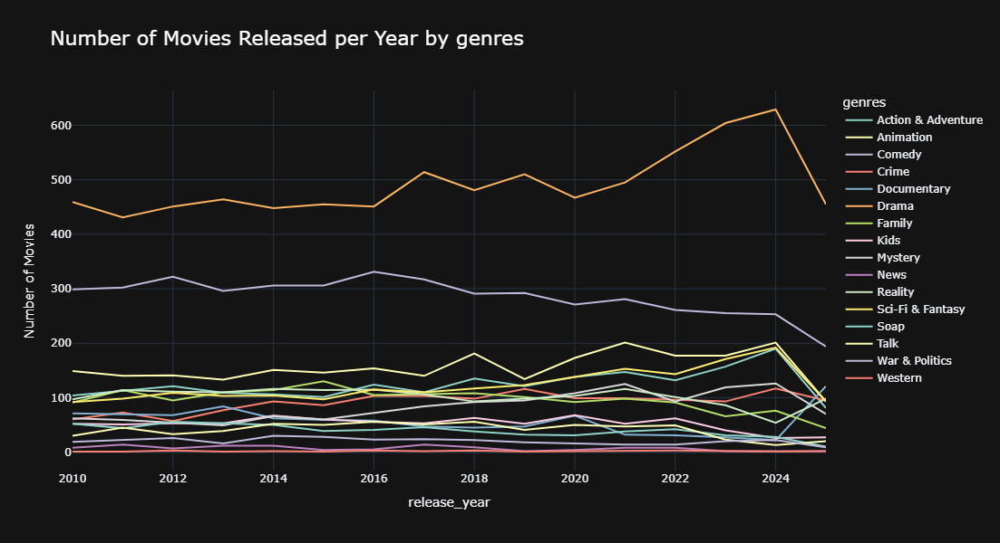

In [73]:
plot_number_across_time(shows_exploded,'genres','release_year')

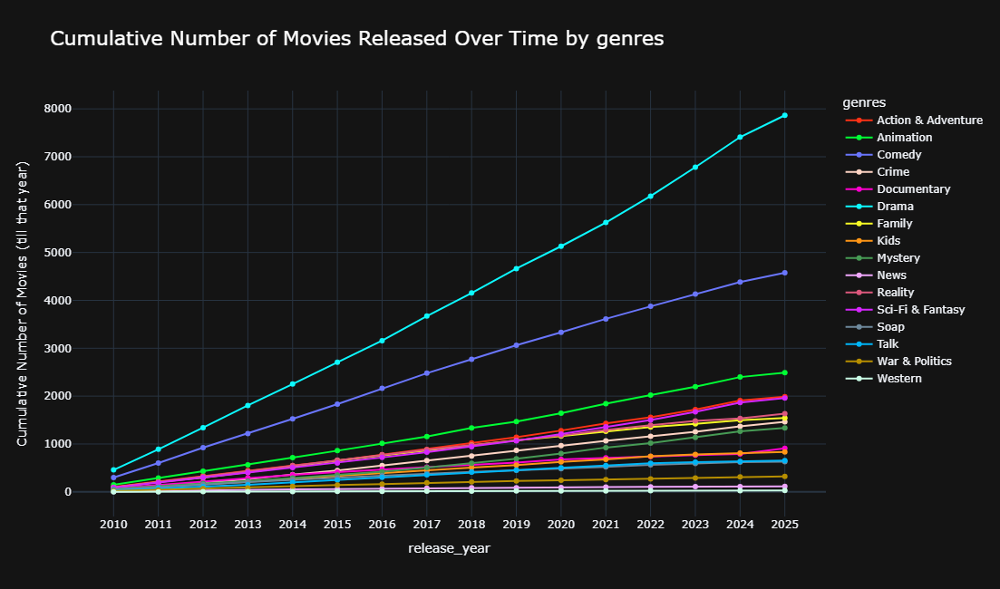

In [74]:
cumulative_number_plot(shows_exploded,'release_year','genres')

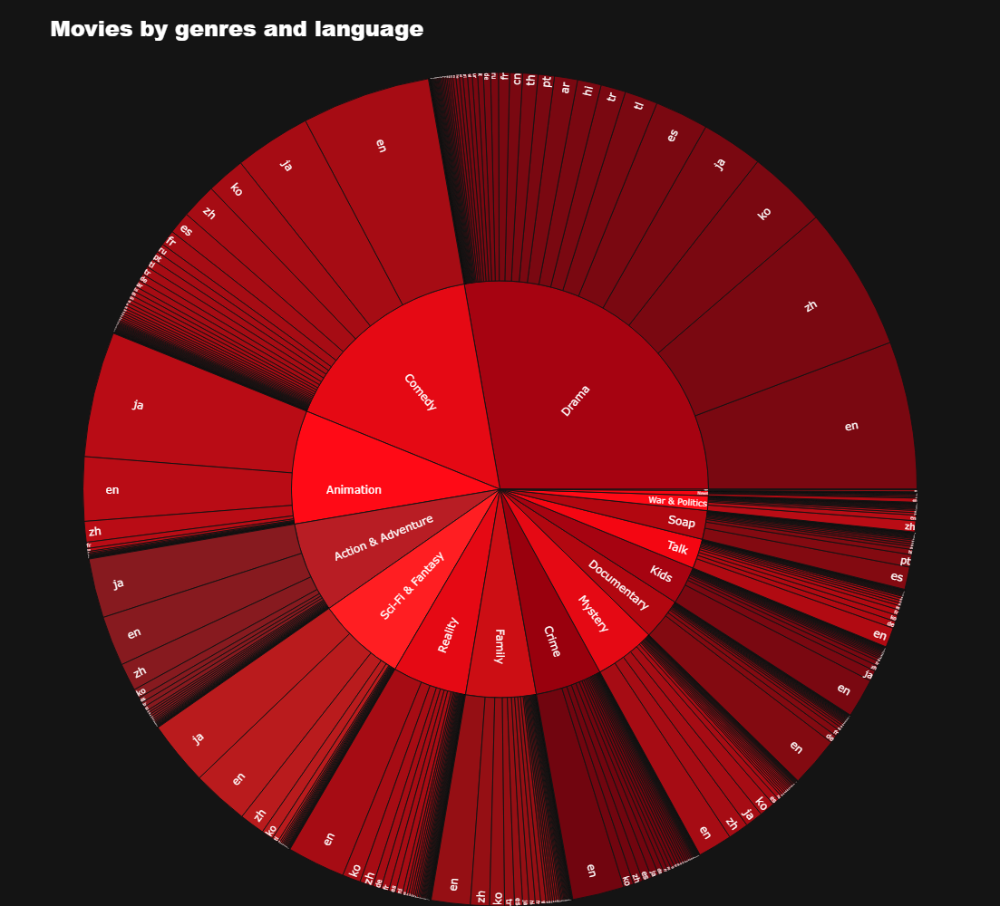

In [75]:
sunburst_plot(shows_exploded,'genres','language')

In [76]:
dic={'Drama ,Action & Adventure': 6.662406392694064,
 'Drama ,Mystery': 6.521516806722694,
 'Drama ,Kids': 5.647910256410256,
 'Drama ,Comedy': 6.176691521346972,
 'Drama ,Western': 7.098649999999999,
 'Drama ,Documentary': 6.813968749999999,
 'Drama ,Unknown': 5.619287671232877,
 'Drama ,Talk': 5.111111111111111,
 'Drama ,Animation': 7.24181359649123,
 'Drama ,Reality': 6.125584415584414,
 'Drama ,War & Politics': 5.521370967741933,
 'Drama ,Sci-Fi & Fantasy': 6.571832026875698,
 'Drama ,Crime': 6.6063973256924555,
 'Drama ,Soap': 5.355972281449893,
 'Drama ,Family': 5.325178343949043,
 'Drama ,News': 7.3,
 'Action & Adventure ,Mystery': 6.884989898989897,
 'Action & Adventure ,Kids': 6.709835680751175,
 'Action & Adventure ,Comedy': 6.96639365671641,
 'Action & Adventure ,Western': 6.296,
 'Action & Adventure ,Documentary': 6.488187500000001,
 'Action & Adventure ,Talk': 5.133333333333334,
 'Action & Adventure ,Animation': 7.153025826446273,
 'Action & Adventure ,Reality': 6.609541666666668,
 'Action & Adventure ,War & Politics': 6.704106666666668,
 'Action & Adventure ,Sci-Fi & Fantasy': 7.056924508790062,
 'Action & Adventure ,Crime': 6.70922844827586,
 'Action & Adventure ,Soap': 7.0955,
 'Action & Adventure ,Family': 6.936427631578952,
 'Mystery ,Kids': 5.748696969696969,
 'Mystery ,Comedy': 6.978216216216218,
 'Mystery ,Western': 6.9,
 'Mystery ,Documentary': 7.243448275862069,
 'Mystery ,Unknown': 6.340000000000001,
 'Mystery ,Talk': 4.68,
 'Mystery ,Animation': 7.584060000000003,
 'Mystery ,Reality': 6.2714285714285705,
 'Mystery ,War & Politics': 6.779529411764706,
 'Mystery ,Sci-Fi & Fantasy': 6.961425925925927,
 'Mystery ,Crime': 6.619093607305938,
 'Mystery ,Soap': 5.393780487804878,
 'Mystery ,Family': 6.201932203389831,
 'Kids ,Comedy': 6.493463722397476,
 'Kids ,Documentary': 3.83125,
 'Kids ,Talk': 5.225,
 'Kids ,Animation': 6.084003294892912,
 'Kids ,Reality': 5.347058823529412,
 'Kids ,War & Politics': 7.0,
 'Kids ,Sci-Fi & Fantasy': 6.662466666666671,
 'Kids ,Crime': 6.969,
 'Kids ,Soap': 6.471428571428571,
 'Kids ,Family': 6.44149146757679,
 'Kids ,News': 5.0,
 'Comedy ,Western': 3.7035,
 'Comedy ,Documentary': 6.070270833333333,
 'Comedy ,Unknown': 6.047619047619048,
 'Comedy ,Talk': 5.082993827160493,
 'Comedy ,Animation': 6.9019775,
 'Comedy ,Reality': 5.789664516129032,
 'Comedy ,War & Politics': 6.510363636363636,
 'Comedy ,Sci-Fi & Fantasy': 6.942268104776573,
 'Comedy ,Crime': 6.868409090909091,
 'Comedy ,Soap': 5.357032000000001,
 'Comedy ,Family': 6.09250151057402,
 'Comedy ,News': 5.222481481481482,
 'Western ,Animation': 4.533333333333334,
 'Western ,Sci-Fi & Fantasy': 7.9705,
 'Western ,Crime': 7.161199999999999,
 'Western ,Family': 3.95,
 'Documentary ,Unknown': 7.666666666666667,
 'Documentary ,Talk': 5.022916666666666,
 'Documentary ,Animation': 4.875,
 'Documentary ,Reality': 5.740117977528091,
 'Documentary ,War & Politics': 6.741041666666667,
 'Documentary ,Sci-Fi & Fantasy': 7.528571428571428,
 'Documentary ,Crime': 6.602801801801804,
 'Documentary ,Soap': 6.433333333333333,
 'Documentary ,Family': 4.8805555555555555,
 'Documentary ,News': 4.2153846153846155,
 'Unknown ,Animation': 6.5,
 'Unknown ,Sci-Fi & Fantasy': 6.05,
 'Unknown ,Crime': 6.1,
 'Unknown ,Soap': 6.275,
 'Unknown ,Family': 5.048,
 'Talk ,Animation': 5.441750000000001,
 'Talk ,Reality': 4.625141509433962,
 'Talk ,War & Politics': 5.666666666666667,
 'Talk ,Sci-Fi & Fantasy': 5.5,
 'Talk ,Crime': 5.4875,
 'Talk ,Soap': 2.5,
 'Talk ,Family': 3.7719473684210527,
 'Talk ,News': 4.205872340425532,
 'Animation ,War & Politics': 7.342,
 'Animation ,Sci-Fi & Fantasy': 7.151852040816318,
 'Animation ,Crime': 7.594133333333332,
 'Animation ,Soap': 1.625,
 'Animation ,Family': 6.587009118541033,
 'Reality ,War & Politics': 9.2,
 'Reality ,Sci-Fi & Fantasy': 7.82,
 'Reality ,Crime': 5.705405405405406,
 'Reality ,Soap': 2.675,
 'Reality ,Family': 5.668799999999999,
 'Reality ,News': 2.0,
 'War & Politics ,Sci-Fi & Fantasy': 7.486807692307693,
 'War & Politics ,Crime': 6.980666666666666,
 'War & Politics ,Soap': 4.075,
 'War & Politics ,Family': 5.840111111111112,
 'War & Politics ,News': 6.8,
 'Sci-Fi & Fantasy ,Crime': 7.15325925925926,
 'Sci-Fi & Fantasy ,Soap': 6.201333333333333,
 'Sci-Fi & Fantasy ,Family': 6.913335570469802,
 'Crime ,Soap': 5.454413793103448,
 'Crime ,Family': 4.854291666666666,
 'Crime ,News': 3.95,
 'Soap ,Family': 5.467476190476191,
 'Family ,News': 5.5}

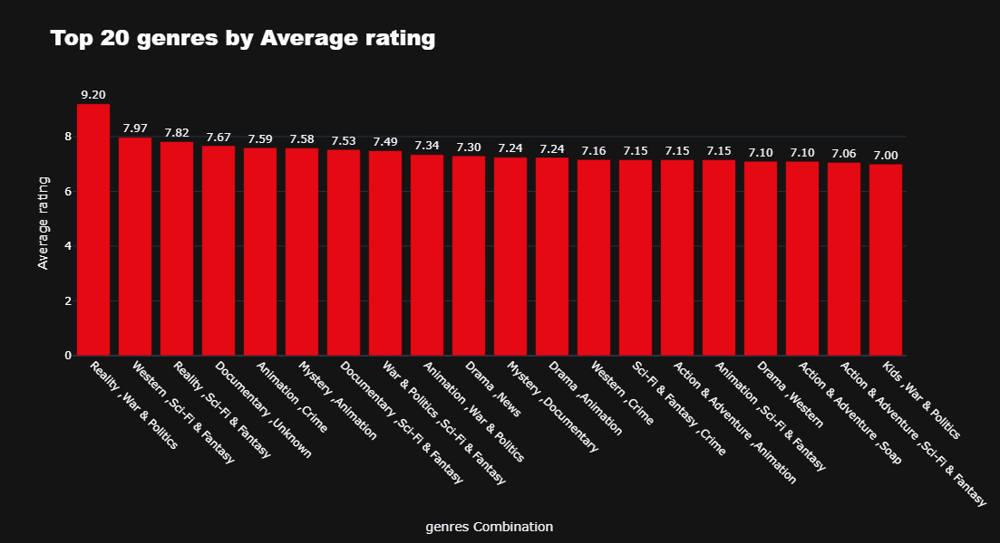

In [79]:
plot_top20(dic,'genres','rating')

In [82]:
dic={'Crime ,Drama': 70.99882043935055,
 'Crime ,Action & Adventure': 76.32718534482757,
 'Crime ,Reality': 71.17202702702703,
 'Crime ,Documentary': 46.815972972972986,
 'Crime ,Western': 54.3452,
 'Crime ,Family': 73.09110416666668,
 'Crime ,Kids': 54.2415,
 'Crime ,Sci-Fi & Fantasy': 60.83068518518517,
 'Crime ,War & Politics': 41.23266666666667,
 'Crime ,News': 82.81924999999998,
 'Crime ,Comedy': 66.76142613636362,
 'Crime ,Talk': 86.18062499999999,
 'Crime ,Soap': 175.18486206896551,
 'Crime ,Animation': 49.64264444444444,
 'Crime ,Unknown': 19.65,
 'Crime ,Mystery': 55.691200913242064,
 'Drama ,Action & Adventure': 75.36334132420089,
 'Drama ,Reality': 74.99035064935066,
 'Drama ,Documentary': 58.577218750000014,
 'Drama ,Western': 111.21660000000004,
 'Drama ,Family': 89.01904968152864,
 'Drama ,Kids': 60.28620512820515,
 'Drama ,Sci-Fi & Fantasy': 61.89588465845468,
 'Drama ,War & Politics': 52.874391129032254,
 'Drama ,News': 131.427,
 'Drama ,Comedy': 62.84385267588699,
 'Drama ,Talk': 78.89722222222223,
 'Drama ,Soap': 148.26034541577832,
 'Drama ,Animation': 49.206690789473676,
 'Drama ,Unknown': 53.67816438356166,
 'Drama ,Mystery': 57.009432773109175,
 'Action & Adventure ,Reality': 138.097375,
 'Action & Adventure ,Documentary': 62.98349999999999,
 'Action & Adventure ,Western': 76.20757142857143,
 'Action & Adventure ,Family': 90.08746710526314,
 'Action & Adventure ,Kids': 69.10409859154929,
 'Action & Adventure ,Sci-Fi & Fantasy': 67.55941985522239,
 'Action & Adventure ,War & Politics': 69.16906666666667,
 'Action & Adventure ,Comedy': 68.96865485074628,
 'Action & Adventure ,Talk': 65.13799999999999,
 'Action & Adventure ,Soap': 102.32745454545456,
 'Action & Adventure ,Animation': 63.16794628099174,
 'Action & Adventure ,Mystery': 61.925904040404056,
 'Reality ,Documentary': 53.17171910112363,
 'Reality ,Family': 89.36863333333332,
 'Reality ,Kids': 121.2045882352941,
 'Reality ,Sci-Fi & Fantasy': 120.35366666666668,
 'Reality ,War & Politics': 38.474,
 'Reality ,News': 51.184250000000006,
 'Reality ,Comedy': 106.73122580645159,
 'Reality ,Talk': 103.99740566037737,
 'Reality ,Soap': 84.83200000000001,
 'Reality ,Mystery': 82.12795238095235,
 'Documentary ,Family': 39.04836111111111,
 'Documentary ,Kids': 44.085687500000006,
 'Documentary ,Sci-Fi & Fantasy': 55.50842857142858,
 'Documentary ,War & Politics': 53.83479166666667,
 'Documentary ,News': 70.12715384615385,
 'Documentary ,Comedy': 39.604854166666655,
 'Documentary ,Talk': 84.16425000000001,
 'Documentary ,Soap': 90.63966666666666,
 'Documentary ,Animation': 36.943875,
 'Documentary ,Unknown': 34.27533333333333,
 'Documentary ,Mystery': 65.8735172413793,
 'Western ,Family': 31.264,
 'Western ,Sci-Fi & Fantasy': 115.809,
 'Western ,Comedy': 46.903499999999994,
 'Western ,Animation': 52.125,
 'Western ,Mystery': 51.177,
 'Family ,Kids': 77.06653924914673,
 'Family ,Sci-Fi & Fantasy': 76.1128993288591,
 'Family ,War & Politics': 53.763333333333335,
 'Family ,News': 60.726,
 'Family ,Comedy': 87.33403776435043,
 'Family ,Talk': 107.65431578947369,
 'Family ,Soap': 152.98734285714286,
 'Family ,Animation': 81.1914224924012,
 'Family ,Unknown': 78.63992000000002,
 'Family ,Mystery': 66.56344067796611,
 'Kids ,Sci-Fi & Fantasy': 69.05667222222223,
 'Kids ,War & Politics': 13.99,
 'Kids ,News': 255.00650000000002,
 'Kids ,Comedy': 78.40964984227134,
 'Kids ,Talk': 50.943,
 'Kids ,Soap': 141.90928571428574,
 'Kids ,Animation': 68.61630477759476,
 'Kids ,Mystery': 79.04,
 'Sci-Fi & Fantasy ,War & Politics': 48.86849999999999,
 'Sci-Fi & Fantasy ,Comedy': 62.522138674884395,
 'Sci-Fi & Fantasy ,Talk': 42.4425,
 'Sci-Fi & Fantasy ,Soap': 77.37752380952381,
 'Sci-Fi & Fantasy ,Animation': 61.4431704081633,
 'Sci-Fi & Fantasy ,Unknown': 51.455,
 'Sci-Fi & Fantasy ,Mystery': 55.55655555555553,
 'War & Politics ,News': 43.901799999999994,
 'War & Politics ,Comedy': 32.98109090909091,
 'War & Politics ,Talk': 113.37133333333334,
 'War & Politics ,Soap': 45.051,
 'War & Politics ,Animation': 37.096199999999996,
 'War & Politics ,Mystery': 43.40205882352941,
 'News ,Comedy': 160.41511111111114,
 'News ,Talk': 139.23876595744682,
 'Comedy ,Talk': 214.17582716049395,
 'Comedy ,Soap': 140.85902399999998,
 'Comedy ,Animation': 60.0397483333333,
 'Comedy ,Unknown': 36.96740476190477,
 'Comedy ,Mystery': 56.594891891891905,
 'Talk ,Soap': 101.745,
 'Talk ,Animation': 146.09825,
 'Talk ,Mystery': 117.35419999999999,
 'Soap ,Animation': 63.83075,
 'Soap ,Unknown': 168.468,
 'Soap ,Mystery': 204.67560975609757,
 'Animation ,Unknown': 31.3784,
 'Animation ,Mystery': 49.22004666666666,
 'Unknown ,Mystery': 27.910000000000004}

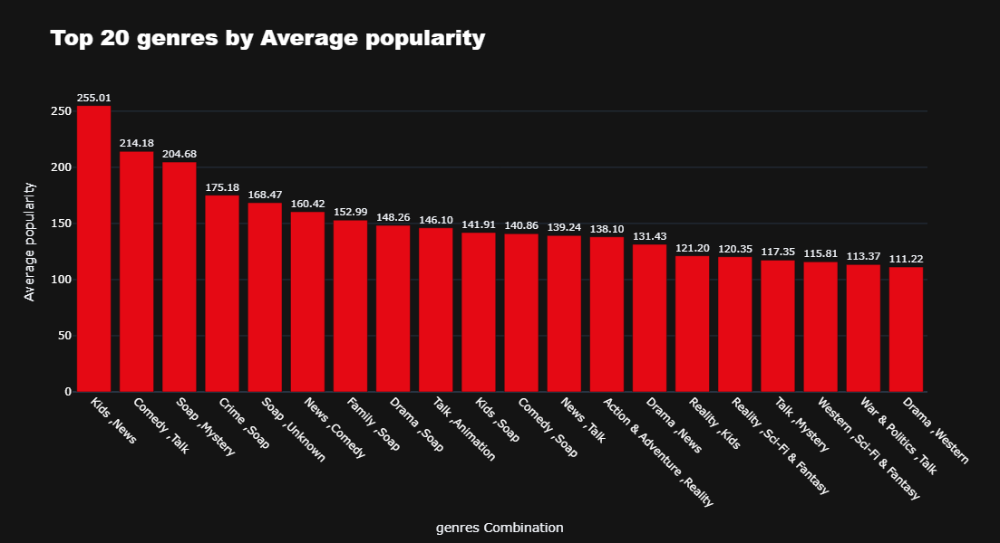

In [83]:
plot_top20(dic,'genres','popularity')

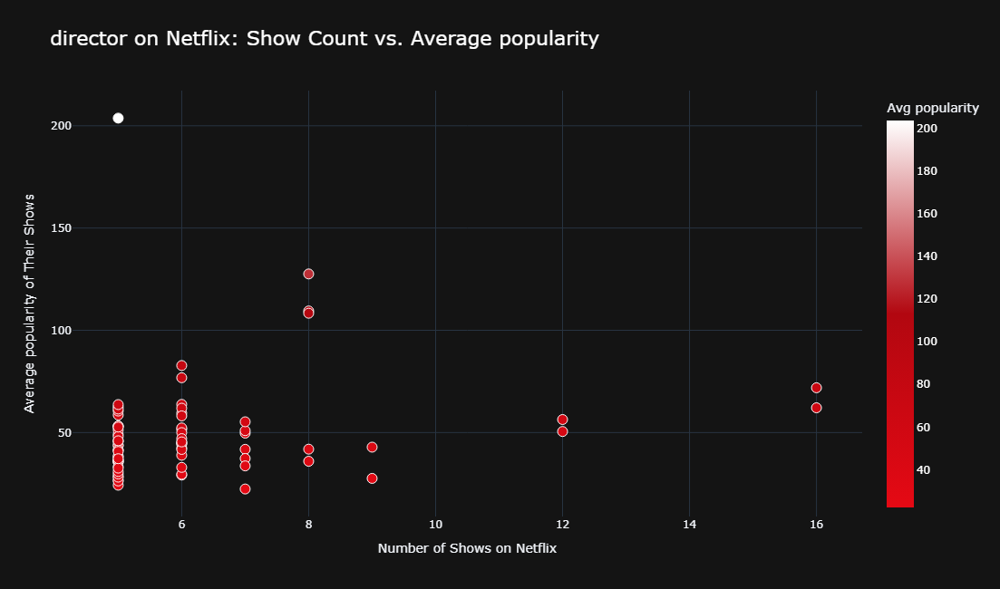

TOP 10 HIGH POTENTIAL UNDERREPRESENTED DIRECTORS
                  director     avg_var  number of shows on Netflix
3332                Yan Ji  203.743900                           5
2065  Mark Sicat Dela Cruz   63.687429                           5
1039          Hong Seok-ku   62.572333                           5
1679       L.A. Madridejos   61.493667                           5
1237             Jian Chen   60.533500                           5
1197      Jeffrey Jeturian   58.586375                           5
3490         Zhang Kaizhou   53.279000                           5
1866           Lin He Long   53.136111                           5
3426             Yu Je-won   52.813929                           5
3493              Zhang Li   52.671778                           5


C:\Users\johnf\forks\Netflix\helper_functions.py:3508: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [98]:
gap_analysis(shows_exploded,'director','popularity',False)

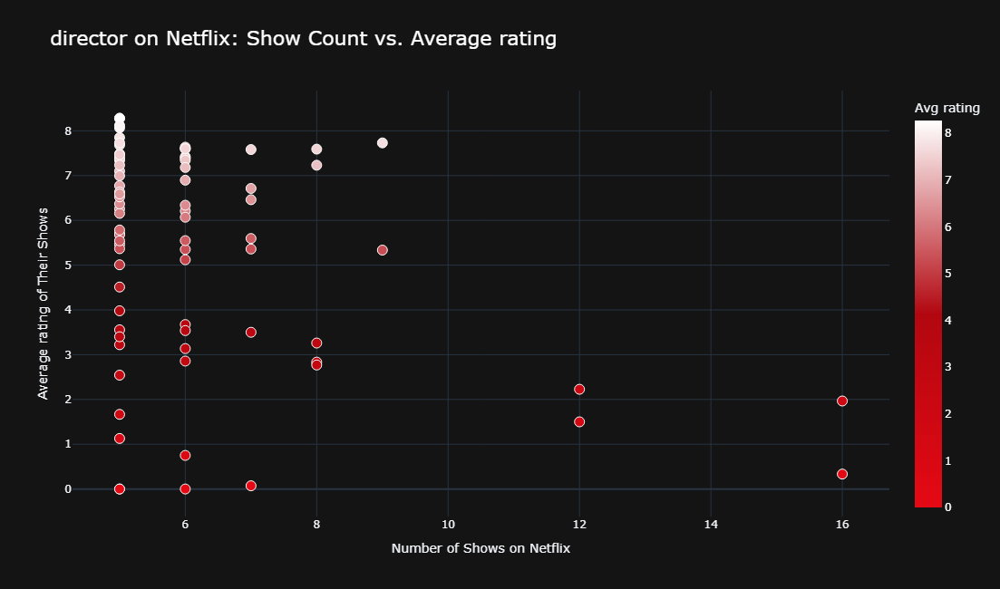

TOP 10 HIGH POTENTIAL UNDERREPRESENTED DIRECTORS
                 director   avg_var  movie_count
1682       Lai Chun Tsang  8.283333            5
1824           Li Haoling  8.275000            5
3426            Yu Je-won  8.121000            5
2933  Steve Cheng Wai-Man  8.066667            5
1764         Lee Jung-sub  7.848800            5
3490        Zhang Kaizhou  7.730000            5
3398           Yoo In-sik  7.681909            5
436         Chen Rong Hui  7.483333            5
2591            Ramy Imam  7.465000            5
1914           Liu Yi Zhi  7.395250            5


In [102]:
gap_analysis(shows_exploded,'director','rating',False)